# DAEN 429 Project: Sign Language Recognition

Randil Wijayananda
DAEN 429  
December 8, 2025

Project Overview

This notebook implements a sign language recognition system that:
1. classifies static ASL alphabet images using transfer learning with ResNet-18
2. extends to dynamic word level video recognition using temporal modeling

### Experiments:
- **T-A:** Head-only fine-tuning
- **T-B:** Last block (layer4) + head fine-tuning
- **T-C:** Progressive unfreezing (layer3 + layer4 + head)
- **S-A:** Training from scratch

## Phase 0: Setup & Environment

In [121]:
import os
import copy
import random
import numpy as np
import pandas as pd
from collections import defaultdict
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, Dataset
import torchvision
from torchvision import datasets, transforms, models

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')

In [ ]:
# selecting CUDA device
device = torch.device('cuda')
print(f"using device: {device}")
print(f"GPU: {torch.cuda.get_device_name(0)}")

using device: cuda
GPU: NVIDIA A100-SXM4-40GB


In [39]:
# setting all random seeds for reproducibility
def set_seed(seed=429):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(429)

## Phase 1: Data Loading & Preparation

In [ ]:
import os
# setting Kaggle API token
os.environ['KAGGLE_API_TOKEN'] = 'KGAT_4093f3969801853cf0b41d15e131b133'

In [ ]:
import kagglehub
# downloading ASL dataset via KaggleHub
path = kagglehub.dataset_download("grassknoted/asl-alphabet")
print("path to dataset files:", path)

Using Colab cache for faster access to the 'asl-alphabet' dataset.
path to dataset files: /kaggle/input/asl-alphabet


In [ ]:
import os
# listing dataset root contents
print(os.listdir(path))

['asl_alphabet_test', 'asl_alphabet_train']


In [ ]:
# inspecting train/test directories
print("Train folder:", os.listdir(path + '/asl_alphabet_train'))
print("Test folder:", os.listdir(path + '/asl_alphabet_test'))

Train folder: ['asl_alphabet_train']
Test folder: ['asl_alphabet_test']


In [ ]:
# defining dataset paths
DATA_DIR = '/kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train'
TEST_DIR = '/kaggle/input/asl-alphabet/asl_alphabet_test/asl_alphabet_test'
CUSTOM_TEST_DIR = './custom_test'

print(f"Train classes: {os.listdir(DATA_DIR)[:5]}...")
print(f"Test files: {os.listdir(TEST_DIR)[:5]}...")

Train classes: ['N', 'R', 'space', 'B', 'I']...
Test files: ['A_test.jpg', 'E_test.jpg', 'L_test.jpg', 'N_test.jpg', 'S_test.jpg']...


In [ ]:
# creating output directories
os.makedirs('./checkpoints', exist_ok=True)
os.makedirs('./results', exist_ok=True)
os.makedirs(CUSTOM_TEST_DIR, exist_ok=True)

print(f"Training data: {DATA_DIR}")
print(f"Test data: {TEST_DIR}")
print(f"Custom test: {CUSTOM_TEST_DIR}")

Training data: /kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train
Test data: /kaggle/input/asl-alphabet/asl_alphabet_test/asl_alphabet_test
Custom test: ./custom_test


In [ ]:
# defining ImageNet normalization and transforms
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.3),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

print("transforms defined")

transforms defined


In [ ]:
# building ImageFolder dataset with augmentations
full_dataset = datasets.ImageFolder(root=DATA_DIR, transform=train_transform)
class_names = full_dataset.classes
num_classes = len(class_names)

print(f"total images: {len(full_dataset)}")
print(f"num of classes: {num_classes}")
print(f"classes: {class_names}")

total images: 87000
num of classes: 29
classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'del', 'nothing', 'space']


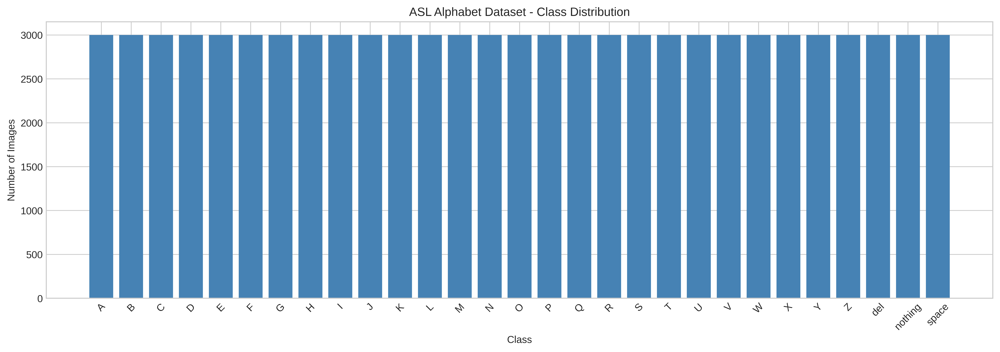

In [48]:
# visualizing class distribution
class_counts = defaultdict(int)
for _, label in full_dataset.samples:
    class_counts[class_names[label]] += 1

plt.figure(figsize=(14, 5), dpi=600)
plt.bar(class_counts.keys(), class_counts.values(), color='steelblue')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('ASL Alphabet Dataset - Class Distribution')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('./results/class_distribution.png', dpi=600)
plt.show()

In [ ]:
# performing stratified 80/20 split with seed=429
indices = np.arange(len(full_dataset))
labels = np.array([label for _, label in full_dataset.samples])

train_idx, val_idx = train_test_split(
    indices, test_size=0.2, stratify=labels, random_state=429
)

print(f"training samples: {len(train_idx)}")
print(f"validation samples: {len(val_idx)}")

training samples: 69600
validation samples: 17400


In [ ]:
# building train/val subsets with transforms
train_dataset_aug = datasets.ImageFolder(root=DATA_DIR, transform=train_transform)
train_dataset = Subset(train_dataset_aug, train_idx)

val_dataset_no_aug = datasets.ImageFolder(root=DATA_DIR, transform=val_transform)
val_dataset = Subset(val_dataset_no_aug, val_idx)

print(f"train size: {len(train_dataset)}, val size: {len(val_dataset)}")

train size: 69600, val size: 17400


In [ ]:
# building dataloaders for train/val sets
BATCH_SIZE = 64
NUM_WORKERS = 4

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

print(f"train batches: {len(train_loader)}, val batches: {len(val_loader)}")

train batches: 1088, val batches: 272


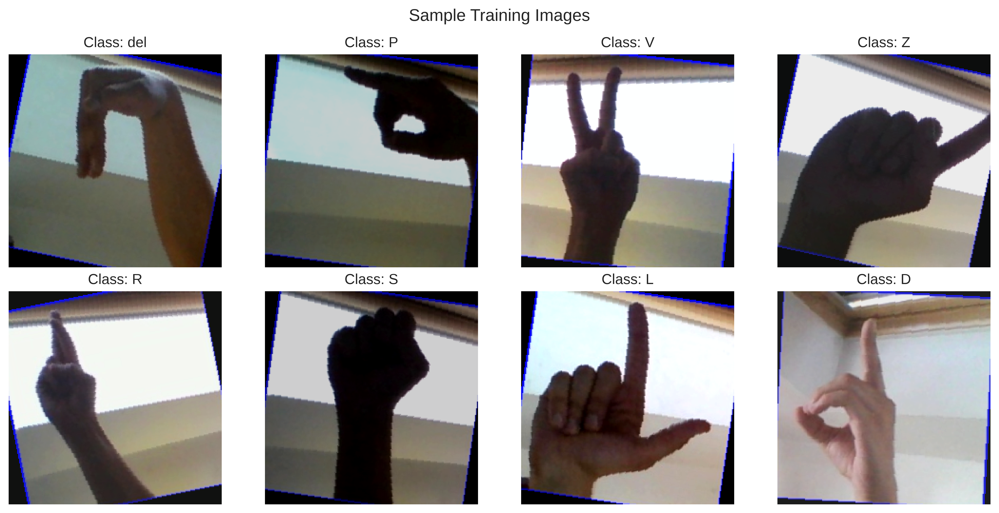

In [52]:
# visualizing sample images
images, labels_batch = next(iter(train_loader))

fig, axes = plt.subplots(2, 4, figsize=(12, 6), dpi=600)
for i, ax in enumerate(axes.flat):
    ax.axis('off')
    img = images[i].numpy().transpose((1, 2, 0))
    img = np.array(IMAGENET_STD) * img + np.array(IMAGENET_MEAN)
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.set_title(f"Class: {class_names[labels_batch[i]]}")

plt.suptitle('Sample Training Images', fontsize=14)
plt.tight_layout()
plt.savefig('./results/sample_images.png', dpi=600)
plt.show()

## Phase 1: Model & Helper Functions

In [ ]:
# ResNet-18 architecture
resnet18_ex = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
print("ResNet-18 Architecture:")
for name, module in resnet18_ex.named_children():
    print(f"  {name}: {module.__class__.__name__}")

total_params = sum(p.numel() for p in resnet18_ex.parameters())
print(f"\ntotal parameters: {total_params:,}")
del resnet18_ex

ResNet-18 Architecture:
  conv1: Conv2d
  bn1: BatchNorm2d
  relu: ReLU
  maxpool: MaxPool2d
  layer1: Sequential
  layer2: Sequential
  layer3: Sequential
  layer4: Sequential
  avgpool: AdaptiveAvgPool2d
  fc: Linear

total parameters: 11,689,512


In [54]:
# creating ResNet-18 with modified classifier head
def create_resnet18_model(num_classes, pretrained=True):
    if pretrained:
        model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    else:
        model = models.resnet18(weights=None)
    
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)
    return model

test_model = create_resnet18_model(29, True)
print(f"modified fc layer: {test_model.fc}")
del test_model

modified fc layer: Linear(in_features=512, out_features=29, bias=True)


In [ ]:
# freezing/unfreezing layers by configuration
def freeze_layers(model, freeze_config):
    for param in model.parameters():
        param.requires_grad = True
    
    if freeze_config == 'T-A':
        for name, param in model.named_parameters():
            if 'fc' not in name:
                param.requires_grad = False
                
    elif freeze_config == 'T-B':
        layers_to_freeze = ['conv1', 'bn1', 'layer1', 'layer2', 'layer3']
        for name, param in model.named_parameters():
            for layer in layers_to_freeze:
                if name.startswith(layer):
                    param.requires_grad = False
                    break
                    
    elif freeze_config == 'T-C':
        layers_to_freeze = ['conv1', 'bn1', 'layer1', 'layer2']
        for name, param in model.named_parameters():
            for layer in layers_to_freeze:
                if name.startswith(layer):
                    param.requires_grad = False
                    break
    return model

def count_parameters(model):
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    return trainable, total

def print_freeze_status(model):
    sections = {}
    for name, param in model.named_parameters():
        section = name.split('.')[0]
        if section not in sections:
            sections[section] = param.requires_grad
    
    print("layer freeze status:")
    for section, trainable in sections.items():
        status = "TRAINABLE" if trainable else "FROZEN"
        print(f"  {section}: {status}")
    
    trainable, total = count_parameters(model)
    print(f"trainable: {trainable:,} / {total:,} ({100*trainable/total:.1f}%)")

In [56]:
# setting BatchNorm layers to eval mode for frozen sections
def set_bn_eval(model, freeze_config):
    if freeze_config == 'T-A':
        for module in model.modules():
            if isinstance(module, nn.BatchNorm2d):
                module.eval()
                
    elif freeze_config == 'T-B':
        frozen_sections = ['bn1', 'layer1', 'layer2', 'layer3']
        for name, module in model.named_modules():
            if isinstance(module, nn.BatchNorm2d):
                for section in frozen_sections:
                    if section in name or name == 'bn1':
                        module.eval()
                        break
                        
    elif freeze_config == 'T-C':
        frozen_sections = ['bn1', 'layer1', 'layer2']
        for name, module in model.named_modules():
            if isinstance(module, nn.BatchNorm2d):
                for section in frozen_sections:
                    if section in name or name == 'bn1':
                        module.eval()
                        break
    return model

In [57]:
# testing freeze configurations
for config in ['T-A', 'T-B', 'T-C', 'S-A']:
    print(f"\n{config}:")
    test_model = create_resnet18_model(29, True)
    test_model = freeze_layers(test_model, config)
    print_freeze_status(test_model)
    del test_model


T-A:
layer freeze status:
  conv1: FROZEN
  bn1: FROZEN
  layer1: FROZEN
  layer2: FROZEN
  layer3: FROZEN
  layer4: FROZEN
  fc: TRAINABLE
trainable: 14,877 / 11,191,389 (0.1%)

T-B:
layer freeze status:
  conv1: FROZEN
  bn1: FROZEN
  layer1: FROZEN
  layer2: FROZEN
  layer3: FROZEN
  layer4: TRAINABLE
  fc: TRAINABLE
trainable: 8,408,605 / 11,191,389 (75.1%)

T-C:
layer freeze status:
  conv1: FROZEN
  bn1: FROZEN
  layer1: FROZEN
  layer2: FROZEN
  layer3: TRAINABLE
  layer4: TRAINABLE
  fc: TRAINABLE
trainable: 10,508,317 / 11,191,389 (93.9%)

S-A:
layer freeze status:
  conv1: TRAINABLE
  bn1: TRAINABLE
  layer1: TRAINABLE
  layer2: TRAINABLE
  layer3: TRAINABLE
  layer4: TRAINABLE
  fc: TRAINABLE
trainable: 11,191,389 / 11,191,389 (100.0%)


## Phase 1: Training & Evaluation Functions

In [58]:
def train_one_epoch(model, train_loader, criterion, optimizer, device, freeze_config):
    model.train()
    model = set_bn_eval(model, freeze_config)
    
    running_loss, correct, total = 0.0, 0, 0
    
    pbar = tqdm(train_loader, desc='Training', leave=False)
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        pbar.set_postfix({'loss': loss.item(), 'acc': correct/total})
    
    return running_loss/total, correct/total

In [59]:
def evaluate(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds, all_labels = [], []
    
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc='Evaluating', leave=False):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    avg_loss = running_loss / len(all_labels)
    accuracy = accuracy_score(all_labels, all_preds)
    macro_f1 = f1_score(all_labels, all_preds, average='macro')
    
    return avg_loss, accuracy, macro_f1, all_preds, all_labels

In [60]:
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler,
                device, num_epochs, freeze_config, experiment_name, checkpoint_path=None):
    
    if checkpoint_path and os.path.exists(checkpoint_path):
        print(f"loading checkpoint from {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
    
    model = model.to(device)
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'val_f1': []}
    best_val_f1 = 0.0
    best_model_state = None
    
    print(f"\nstarting {experiment_name} training")
    print(f"config: {freeze_config}, epochs: {num_epochs}")
    
    for epoch in range(num_epochs):
        print(f"\nepoch {epoch+1}/{num_epochs}")
        
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device, freeze_config)
        val_loss, val_acc, val_f1, _, _ = evaluate(model, val_loader, criterion, device)
        
        if scheduler:
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_f1)
            else:
                scheduler.step()
        
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_f1'].append(val_f1)
        
        lr = optimizer.param_groups[0]['lr']
        print(f"  train loss: {train_loss:.4f}, acc: {train_acc:.4f}")
        print(f"  val loss: {val_loss:.4f}, acc: {val_acc:.4f}, F1: {val_f1:.4f}, LR: {lr:.6f}")
        
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            best_model_state = copy.deepcopy(model.state_dict())
            print(f"  best val F1: {val_f1:.4f}")
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_f1': val_f1,
                'val_acc': val_acc,
                'history': history
            }, f'./checkpoints/{experiment_name}_best.pth')
    
    if best_model_state:
        model.load_state_dict(best_model_state)
    
    print(f"\ntraining complete, best val F1: {best_val_f1:.4f}")
    return model, history

In [61]:
def plot_training_history(history, experiment_name):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), dpi=600)
    epochs = range(1, len(history['train_loss']) + 1)
    
    axes[0].plot(epochs, history['train_loss'], 'b-', label='Train', lw=2)
    axes[0].plot(epochs, history['val_loss'], 'r-', label='Val', lw=2)
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
    axes[0].set_title(f'{experiment_name} - Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)
    
    axes[1].plot(epochs, history['train_acc'], 'b-', label='Train', lw=2)
    axes[1].plot(epochs, history['val_acc'], 'r-', label='Val', lw=2)
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
    axes[1].set_title(f'{experiment_name} - Accuracy'); axes[1].legend(); axes[1].grid(True, alpha=0.3)
    
    axes[2].plot(epochs, history['val_f1'], 'g-', label='Val F1', lw=2)
    axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('Macro F1')
    axes[2].set_title(f'{experiment_name} - Val F1'); axes[2].legend(); axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f'./results/{experiment_name}_curves.png', dpi=600)
    plt.show()

def plot_confusion_matrix(y_true, y_pred, class_names, experiment_name, title=None):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 12))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted'); plt.ylabel('True')
    plt.title(title or f'{experiment_name} - Confusion Matrix')
    plt.tight_layout()
    plt.savefig(f'./results/{experiment_name}_cm.png', dpi=600)
    plt.show()

## Phase 1: Ablation Studies

In [ ]:
# setting Phase 1 hyperparameters
LR_TRANSFER = 1e-3
LR_SCRATCH = 1e-2
WEIGHT_DECAY = 1e-4
EPOCHS_TRANSFER = 15
EPOCHS_SCRATCH = 30
EPOCHS_PROGRESSIVE = 10

criterion = nn.CrossEntropyLoss()
all_results = {}

### T-A: Head-Only Fine-Tuning

T-A: Head-Only Fine-Tuning
layer freeze status:
  conv1: FROZEN
  bn1: FROZEN
  layer1: FROZEN
  layer2: FROZEN
  layer3: FROZEN
  layer4: FROZEN
  fc: TRAINABLE
trainable: 14,877 / 11,191,389 (0.1%)

starting T-A training
config: T-A, epochs: 15

epoch 1/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 1.2597, acc: 0.7200
  val loss: 0.6249, acc: 0.8587, F1: 0.8597, LR: 0.001000
  best val F1: 0.8597

epoch 2/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.5756, acc: 0.8637
  val loss: 0.4327, acc: 0.8879, F1: 0.8878, LR: 0.001000
  best val F1: 0.8878

epoch 3/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.4340, acc: 0.8905
  val loss: 0.3362, acc: 0.9098, F1: 0.9101, LR: 0.001000
  best val F1: 0.9101

epoch 4/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.3700, acc: 0.9031
  val loss: 0.2874, acc: 0.9224, F1: 0.9220, LR: 0.001000
  best val F1: 0.9220

epoch 5/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.3240, acc: 0.9134
  val loss: 0.2659, acc: 0.9257, F1: 0.9257, LR: 0.001000
  best val F1: 0.9257

epoch 6/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.3002, acc: 0.9171
  val loss: 0.2466, acc: 0.9290, F1: 0.9285, LR: 0.001000
  best val F1: 0.9285

epoch 7/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2757, acc: 0.9236
  val loss: 0.2368, acc: 0.9314, F1: 0.9313, LR: 0.001000
  best val F1: 0.9313

epoch 8/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2610, acc: 0.9276
  val loss: 0.2223, acc: 0.9344, F1: 0.9341, LR: 0.001000
  best val F1: 0.9341

epoch 9/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2461, acc: 0.9296
  val loss: 0.2195, acc: 0.9348, F1: 0.9347, LR: 0.001000
  best val F1: 0.9347

epoch 10/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2367, acc: 0.9332
  val loss: 0.2037, acc: 0.9398, F1: 0.9400, LR: 0.001000
  best val F1: 0.9400

epoch 11/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2273, acc: 0.9347
  val loss: 0.1911, acc: 0.9435, F1: 0.9434, LR: 0.001000
  best val F1: 0.9434

epoch 12/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2204, acc: 0.9361
  val loss: 0.2077, acc: 0.9347, F1: 0.9346, LR: 0.001000

epoch 13/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2148, acc: 0.9373
  val loss: 0.1949, acc: 0.9401, F1: 0.9399, LR: 0.001000

epoch 14/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2103, acc: 0.9389
  val loss: 0.1894, acc: 0.9417, F1: 0.9415, LR: 0.001000

epoch 15/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2056, acc: 0.9400
  val loss: 0.1868, acc: 0.9426, F1: 0.9424, LR: 0.000500

training complete, best val F1: 0.9434


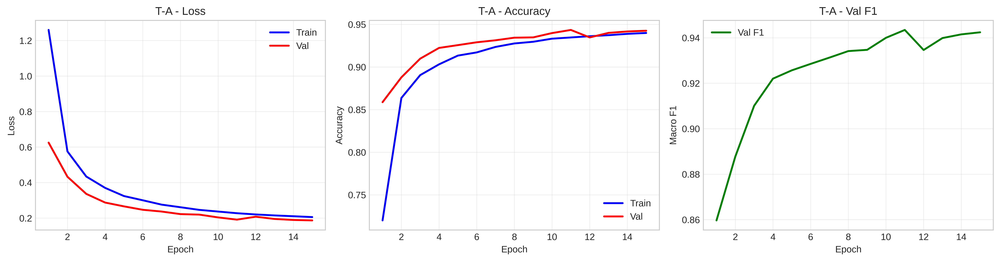


T-A best val F1: 0.9434


In [63]:
print("T-A: Head-Only Fine-Tuning")

set_seed(429)
model_ta = create_resnet18_model(num_classes, pretrained=True)
model_ta = freeze_layers(model_ta, 'T-A')
print_freeze_status(model_ta)

optimizer_ta = optim.Adam(model_ta.fc.parameters(), lr=LR_TRANSFER, weight_decay=WEIGHT_DECAY)
scheduler_ta = optim.lr_scheduler.ReduceLROnPlateau(optimizer_ta, mode='max', factor=0.5, patience=3)

model_ta, history_ta = train_model(
    model_ta, train_loader, val_loader, criterion, optimizer_ta, scheduler_ta,
    device, EPOCHS_TRANSFER, 'T-A', 'T-A'
)

plot_training_history(history_ta, 'T-A')
all_results['T-A'] = {'history': history_ta, 'best_val_f1': max(history_ta['val_f1']), 'best_val_acc': max(history_ta['val_acc'])}
print(f"\nT-A best val F1: {all_results['T-A']['best_val_f1']:.4f}")

### T-B: Last Block Fine-Tuning

T-B: layer4 + Head Fine-Tuning
layer freeze status:
  conv1: FROZEN
  bn1: FROZEN
  layer1: FROZEN
  layer2: FROZEN
  layer3: FROZEN
  layer4: TRAINABLE
  fc: TRAINABLE
trainable: 8,408,605 / 11,191,389 (75.1%)

starting T-B training
config: T-B, epochs: 15

epoch 1/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1138, acc: 0.9680
  val loss: 0.0617, acc: 0.9815, F1: 0.9813, LR: 0.001000
  best val F1: 0.9813

epoch 2/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0364, acc: 0.9894
  val loss: 0.0543, acc: 0.9825, F1: 0.9826, LR: 0.001000
  best val F1: 0.9826

epoch 3/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0269, acc: 0.9927
  val loss: 0.0260, acc: 0.9926, F1: 0.9927, LR: 0.001000
  best val F1: 0.9927

epoch 4/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0265, acc: 0.9925
  val loss: 0.0187, acc: 0.9945, F1: 0.9945, LR: 0.001000
  best val F1: 0.9945

epoch 5/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0226, acc: 0.9937
  val loss: 0.0308, acc: 0.9902, F1: 0.9903, LR: 0.001000

epoch 6/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0176, acc: 0.9952
  val loss: 0.0121, acc: 0.9967, F1: 0.9967, LR: 0.001000
  best val F1: 0.9967

epoch 7/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0192, acc: 0.9949
  val loss: 0.0159, acc: 0.9954, F1: 0.9954, LR: 0.001000

epoch 8/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0164, acc: 0.9958
  val loss: 0.0047, acc: 0.9990, F1: 0.9990, LR: 0.001000
  best val F1: 0.9990

epoch 9/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0161, acc: 0.9959
  val loss: 0.0151, acc: 0.9959, F1: 0.9959, LR: 0.001000

epoch 10/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0145, acc: 0.9964
  val loss: 0.0171, acc: 0.9947, F1: 0.9947, LR: 0.001000

epoch 11/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0151, acc: 0.9962
  val loss: 0.0078, acc: 0.9984, F1: 0.9984, LR: 0.001000

epoch 12/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0142, acc: 0.9962
  val loss: 0.0053, acc: 0.9989, F1: 0.9988, LR: 0.000500

epoch 13/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0048, acc: 0.9990
  val loss: 0.0015, acc: 0.9997, F1: 0.9997, LR: 0.000500
  best val F1: 0.9997

epoch 14/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0050, acc: 0.9991
  val loss: 0.0025, acc: 0.9997, F1: 0.9997, LR: 0.000500

epoch 15/15


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0068, acc: 0.9986
  val loss: 0.0023, acc: 0.9997, F1: 0.9997, LR: 0.000500

training complete, best val F1: 0.9997


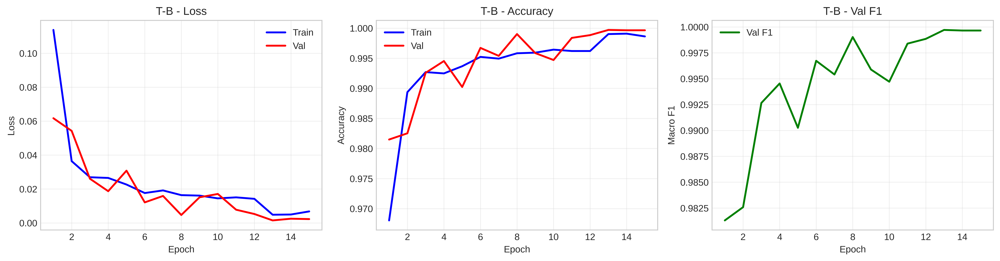


T-B best val F1: 0.9997


In [64]:
print("T-B: layer4 + Head Fine-Tuning")

set_seed(429)
model_tb = create_resnet18_model(num_classes, pretrained=True)
model_tb = freeze_layers(model_tb, 'T-B')
print_freeze_status(model_tb)

params_tb = [p for p in model_tb.parameters() if p.requires_grad]
optimizer_tb = optim.Adam(params_tb, lr=LR_TRANSFER, weight_decay=WEIGHT_DECAY)
scheduler_tb = optim.lr_scheduler.ReduceLROnPlateau(optimizer_tb, mode='max', factor=0.5, patience=3)

model_tb, history_tb = train_model(
    model_tb, train_loader, val_loader, criterion, optimizer_tb, scheduler_tb,
    device, EPOCHS_TRANSFER, 'T-B', 'T-B'
)

plot_training_history(history_tb, 'T-B')
all_results['T-B'] = {'history': history_tb, 'best_val_f1': max(history_tb['val_f1']), 'best_val_acc': max(history_tb['val_acc'])}
print(f"\nT-B best val F1: {all_results['T-B']['best_val_f1']:.4f}")

### T-C: Progressive Unfreezing

T-C: Progressive Unfreezing (from T-B checkpoint)
loaded T-B checkpoint (val F1: 0.9997)
layer freeze status:
  conv1: FROZEN
  bn1: FROZEN
  layer1: FROZEN
  layer2: FROZEN
  layer3: TRAINABLE
  layer4: TRAINABLE
  fc: TRAINABLE
trainable: 10,508,317 / 11,191,389 (93.9%)

starting T-C training
config: T-C, epochs: 10

epoch 1/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0072, acc: 0.9984
  val loss: 0.0016, acc: 0.9999, F1: 0.9999, LR: 0.000100
  best val F1: 0.9999

epoch 2/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0050, acc: 0.9989
  val loss: 0.0013, acc: 0.9998, F1: 0.9998, LR: 0.000100

epoch 3/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0037, acc: 0.9993
  val loss: 0.0007, acc: 1.0000, F1: 1.0000, LR: 0.000100
  best val F1: 1.0000

epoch 4/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0022, acc: 0.9997
  val loss: 0.0020, acc: 0.9997, F1: 0.9997, LR: 0.000100

epoch 5/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0043, acc: 0.9993
  val loss: 0.0011, acc: 0.9998, F1: 0.9998, LR: 0.000100

epoch 6/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0025, acc: 0.9996
  val loss: 0.0004, acc: 1.0000, F1: 1.0000, LR: 0.000050

epoch 7/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0012, acc: 0.9999
  val loss: 0.0005, acc: 1.0000, F1: 1.0000, LR: 0.000050

epoch 8/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0010, acc: 1.0000
  val loss: 0.0004, acc: 1.0000, F1: 1.0000, LR: 0.000050

epoch 9/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0016, acc: 0.9999
  val loss: 0.0005, acc: 1.0000, F1: 1.0000, LR: 0.000025

epoch 10/10


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0012, acc: 0.9999
  val loss: 0.0019, acc: 0.9995, F1: 0.9995, LR: 0.000025

training complete, best val F1: 1.0000


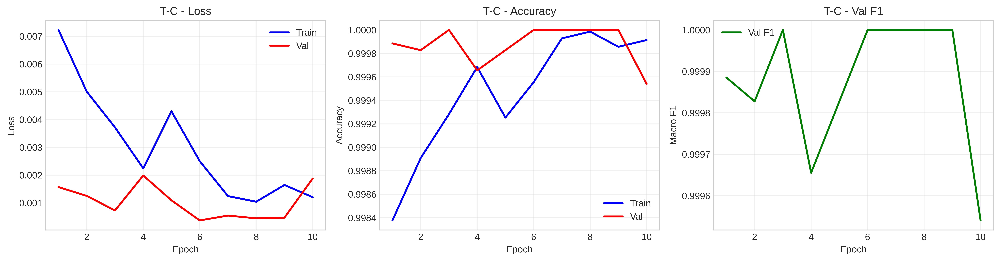


T-C best val F1: 1.0000


In [ ]:
print("T-C: Progressive Unfreezing (from T-B checkpoint)")

set_seed(429)
model_tc = create_resnet18_model(num_classes, pretrained=True)

# loading T-B checkpoint for progressive unfreezing
checkpoint_path = './checkpoints/T-B_best.pth'
if os.path.exists(checkpoint_path):
    ckpt = torch.load(checkpoint_path, map_location=device)
    model_tc.load_state_dict(ckpt['model_state_dict'])
    print(f"loaded T-B checkpoint (val F1: {ckpt['val_f1']:.4f})")

model_tc = freeze_layers(model_tc, 'T-C')
print_freeze_status(model_tc)

params_tc = [p for p in model_tc.parameters() if p.requires_grad]
optimizer_tc = optim.Adam(params_tc, lr=LR_TRANSFER*0.1, weight_decay=WEIGHT_DECAY)
scheduler_tc = optim.lr_scheduler.ReduceLROnPlateau(optimizer_tc, mode='max', factor=0.5, patience=2)

model_tc, history_tc = train_model(
    model_tc, train_loader, val_loader, criterion, optimizer_tc, scheduler_tc,
    device, EPOCHS_PROGRESSIVE, 'T-C', 'T-C'
)

plot_training_history(history_tc, 'T-C')
all_results['T-C'] = {'history': history_tc, 'best_val_f1': max(history_tc['val_f1']), 'best_val_acc': max(history_tc['val_acc'])}
print(f"\nT-C best val F1: {all_results['T-C']['best_val_f1']:.4f}")

### S-A: Training from Scratch

S-A: Training from Scratch
layer freeze status:
  conv1: TRAINABLE
  bn1: TRAINABLE
  layer1: TRAINABLE
  layer2: TRAINABLE
  layer3: TRAINABLE
  layer4: TRAINABLE
  fc: TRAINABLE
trainable: 11,191,389 / 11,191,389 (100.0%)

starting S-A training
config: S-A, epochs: 30

epoch 1/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 1.4054, acc: 0.5741
  val loss: 0.6665, acc: 0.7835, F1: 0.7738, LR: 0.010000
  best val F1: 0.7738

epoch 2/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.2378, acc: 0.9201
  val loss: 0.2107, acc: 0.9237, F1: 0.9241, LR: 0.010000
  best val F1: 0.9241

epoch 3/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1745, acc: 0.9413
  val loss: 0.2297, acc: 0.9198, F1: 0.9187, LR: 0.010000

epoch 4/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1455, acc: 0.9518
  val loss: 0.3522, acc: 0.9049, F1: 0.9055, LR: 0.010000

epoch 5/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1295, acc: 0.9569
  val loss: 0.1984, acc: 0.9318, F1: 0.9312, LR: 0.010000
  best val F1: 0.9312

epoch 6/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1236, acc: 0.9591
  val loss: 0.1349, acc: 0.9505, F1: 0.9504, LR: 0.010000
  best val F1: 0.9504

epoch 7/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1172, acc: 0.9618
  val loss: 0.1133, acc: 0.9651, F1: 0.9650, LR: 0.010000
  best val F1: 0.9650

epoch 8/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1116, acc: 0.9625
  val loss: 0.2148, acc: 0.9301, F1: 0.9305, LR: 0.010000

epoch 9/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1108, acc: 0.9631
  val loss: 0.0599, acc: 0.9813, F1: 0.9813, LR: 0.010000
  best val F1: 0.9813

epoch 10/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.1023, acc: 0.9665
  val loss: 0.1031, acc: 0.9637, F1: 0.9633, LR: 0.001000

epoch 11/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0303, acc: 0.9918
  val loss: 0.0057, acc: 0.9994, F1: 0.9994, LR: 0.001000
  best val F1: 0.9994

epoch 12/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0204, acc: 0.9951
  val loss: 0.0044, acc: 0.9991, F1: 0.9991, LR: 0.001000

epoch 13/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0173, acc: 0.9955
  val loss: 0.0065, acc: 0.9985, F1: 0.9985, LR: 0.001000

epoch 14/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0161, acc: 0.9961
  val loss: 0.0042, acc: 0.9991, F1: 0.9991, LR: 0.001000

epoch 15/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0162, acc: 0.9961
  val loss: 0.0029, acc: 0.9994, F1: 0.9994, LR: 0.001000
  best val F1: 0.9994

epoch 16/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0162, acc: 0.9958
  val loss: 0.0059, acc: 0.9987, F1: 0.9987, LR: 0.001000

epoch 17/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0155, acc: 0.9965
  val loss: 0.0039, acc: 0.9993, F1: 0.9993, LR: 0.001000

epoch 18/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0148, acc: 0.9966
  val loss: 0.0038, acc: 0.9993, F1: 0.9993, LR: 0.001000

epoch 19/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0153, acc: 0.9967
  val loss: 0.0051, acc: 0.9991, F1: 0.9991, LR: 0.001000

epoch 20/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0130, acc: 0.9971
  val loss: 0.0034, acc: 0.9994, F1: 0.9994, LR: 0.000100

epoch 21/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0081, acc: 0.9985
  val loss: 0.0011, acc: 0.9999, F1: 0.9999, LR: 0.000100
  best val F1: 0.9999

epoch 22/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0068, acc: 0.9988
  val loss: 0.0011, acc: 0.9999, F1: 0.9999, LR: 0.000100

epoch 23/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0058, acc: 0.9993
  val loss: 0.0011, acc: 0.9998, F1: 0.9998, LR: 0.000100

epoch 24/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0060, acc: 0.9991
  val loss: 0.0009, acc: 0.9999, F1: 0.9999, LR: 0.000100

epoch 25/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0058, acc: 0.9992
  val loss: 0.0010, acc: 0.9999, F1: 0.9999, LR: 0.000100

epoch 26/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0058, acc: 0.9992
  val loss: 0.0010, acc: 0.9999, F1: 0.9999, LR: 0.000100

epoch 27/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0056, acc: 0.9993
  val loss: 0.0009, acc: 1.0000, F1: 1.0000, LR: 0.000100
  best val F1: 1.0000

epoch 28/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0055, acc: 0.9993
  val loss: 0.0009, acc: 0.9999, F1: 0.9999, LR: 0.000100

epoch 29/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0058, acc: 0.9992
  val loss: 0.0009, acc: 1.0000, F1: 1.0000, LR: 0.000100

epoch 30/30


Training:   0%|          | 0/1088 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

  train loss: 0.0054, acc: 0.9995
  val loss: 0.0010, acc: 1.0000, F1: 1.0000, LR: 0.000010

training complete, best val F1: 1.0000


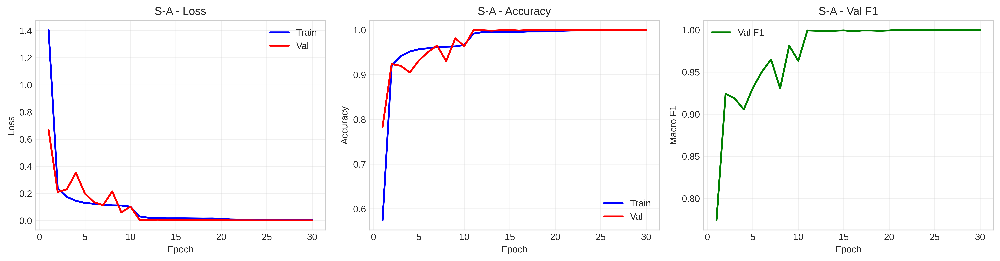


S-A best val F1: 1.0000


In [ ]:
print("S-A: Training from Scratch")

set_seed(429)
model_sa = create_resnet18_model(num_classes, pretrained=False)
model_sa = freeze_layers(model_sa, 'S-A')
print_freeze_status(model_sa)

optimizer_sa = optim.Adam(model_sa.parameters(), lr=LR_SCRATCH, weight_decay=WEIGHT_DECAY)
scheduler_sa = optim.lr_scheduler.StepLR(optimizer_sa, step_size=10, gamma=0.1)

model_sa, history_sa = train_model(
    model_sa, train_loader, val_loader, criterion, optimizer_sa, scheduler_sa,
    device, EPOCHS_SCRATCH, 'S-A', 'S-A'
)

plot_training_history(history_sa, 'S-A')
all_results['S-A'] = {'history': history_sa, 'best_val_f1': max(history_sa['val_f1']), 'best_val_acc': max(history_sa['val_acc'])}
print(f"\nS-A best val F1: {all_results['S-A']['best_val_f1']:.4f}")

## Phase 1: Results Summary

In [67]:
results_df = pd.DataFrame({
    'Experiment': ['T-A (Head Only)', 'T-B (layer4+fc)', 'T-C (Progressive)', 'S-A (Scratch)'],
    'Freeze Config': ['All except fc', 'stem+layer1-3', 'stem+layer1-2', 'None'],
    'Best Val Acc': [all_results[e]['best_val_acc'] for e in ['T-A','T-B','T-C','S-A']],
    'Best Val F1': [all_results[e]['best_val_f1'] for e in ['T-A','T-B','T-C','S-A']]
})

print(results_df.to_string(index=False))
results_df.to_csv('./results/ablation_results.csv', index=False)

       Experiment Freeze Config  Best Val Acc  Best Val F1
  T-A (Head Only) All except fc      0.943506     0.943445
  T-B (layer4+fc) stem+layer1-3      0.999713     0.999713
T-C (Progressive) stem+layer1-2      1.000000     1.000000
    S-A (Scratch)          None      1.000000     1.000000


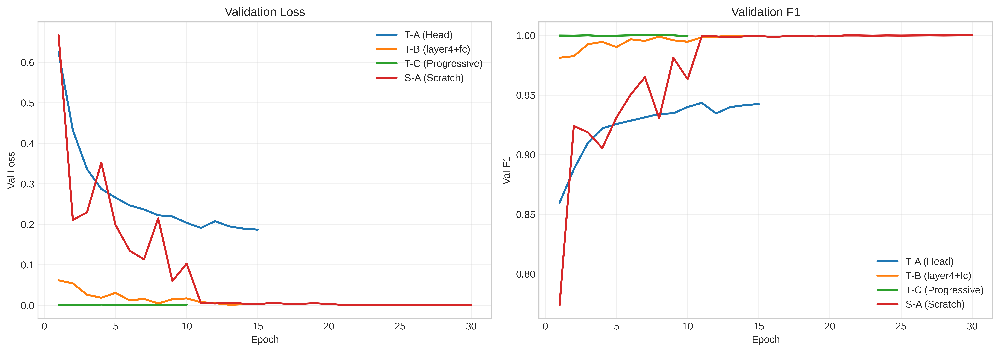

In [ ]:
# plotting comparison curves for ablations
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=600)
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
experiments = ['T-A', 'T-B', 'T-C', 'S-A']
labels = ['T-A (Head)', 'T-B (layer4+fc)', 'T-C (Progressive)', 'S-A (Scratch)']

for i, exp in enumerate(experiments):
    epochs = range(1, len(all_results[exp]['history']['val_loss']) + 1)
    axes[0].plot(epochs, all_results[exp]['history']['val_loss'], color=colors[i], label=labels[i], lw=2)
    axes[1].plot(epochs, all_results[exp]['history']['val_f1'], color=colors[i], label=labels[i], lw=2)

axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Val Loss'); axes[0].set_title('Validation Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Val F1'); axes[1].set_title('Validation F1'); axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('./results/ablation_comparison.png', dpi=600)
plt.show()

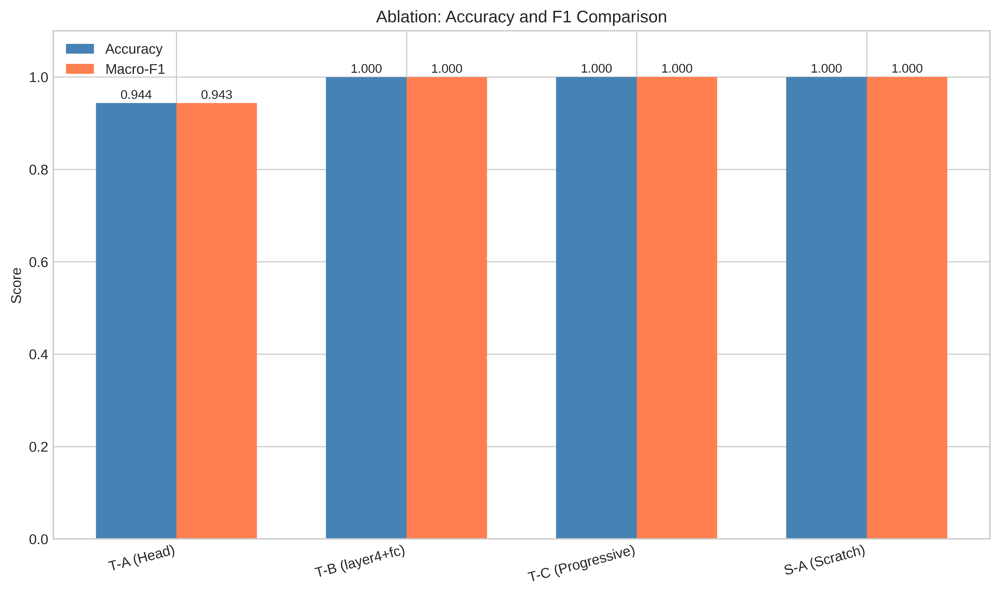

In [ ]:
# plotting accuracy/F1 bar chart
fig, ax = plt.subplots(figsize=(10, 6), dpi=600)
x = np.arange(len(experiments))
width = 0.35

acc_vals = [all_results[e]['best_val_acc'] for e in experiments]
f1_vals = [all_results[e]['best_val_f1'] for e in experiments]

bars1 = ax.bar(x - width/2, acc_vals, width, label='Accuracy', color='steelblue')
bars2 = ax.bar(x + width/2, f1_vals, width, label='Macro-F1', color='coral')

ax.set_ylabel('Score'); ax.set_title('Ablation: Accuracy and F1 Comparison')
ax.set_xticks(x); ax.set_xticklabels(labels, rotation=15, ha='right')
ax.legend(); ax.set_ylim(0, 1.1)

for bar in bars1 + bars2:
    h = bar.get_height()
    ax.annotate(f'{h:.3f}', xy=(bar.get_x() + bar.get_width()/2, h), xytext=(0,3), textcoords='offset points', ha='center', fontsize=9)

plt.tight_layout()
plt.savefig('./results/ablation_bar.png', dpi=600)
plt.show()

In [ ]:
# selecting best model checkpoint and restoring weights
best_exp = max(all_results, key=lambda x: all_results[x]['best_val_f1'])
print(f"best model: {best_exp}")
print(f"val accuracy: {all_results[best_exp]['best_val_acc']:.4f}")
print(f"val macro-F1: {all_results[best_exp]['best_val_f1']:.4f}")

best_model = create_resnet18_model(num_classes, pretrained=True)
ckpt = torch.load(f'./checkpoints/{best_exp}_best.pth', map_location=device)
best_model.load_state_dict(ckpt['model_state_dict'])
best_model = best_model.to(device)
print(f"loaded {best_exp} checkpoint")

best model: T-C
val accuracy: 1.0000
val macro-F1: 1.0000
loaded T-C checkpoint


## Phase 1: Final Evaluation

Evaluating:   0%|          | 0/272 [00:00<?, ?it/s]

validation results (T-C):
  accuracy: 1.0000
  macro-F1: 1.0000


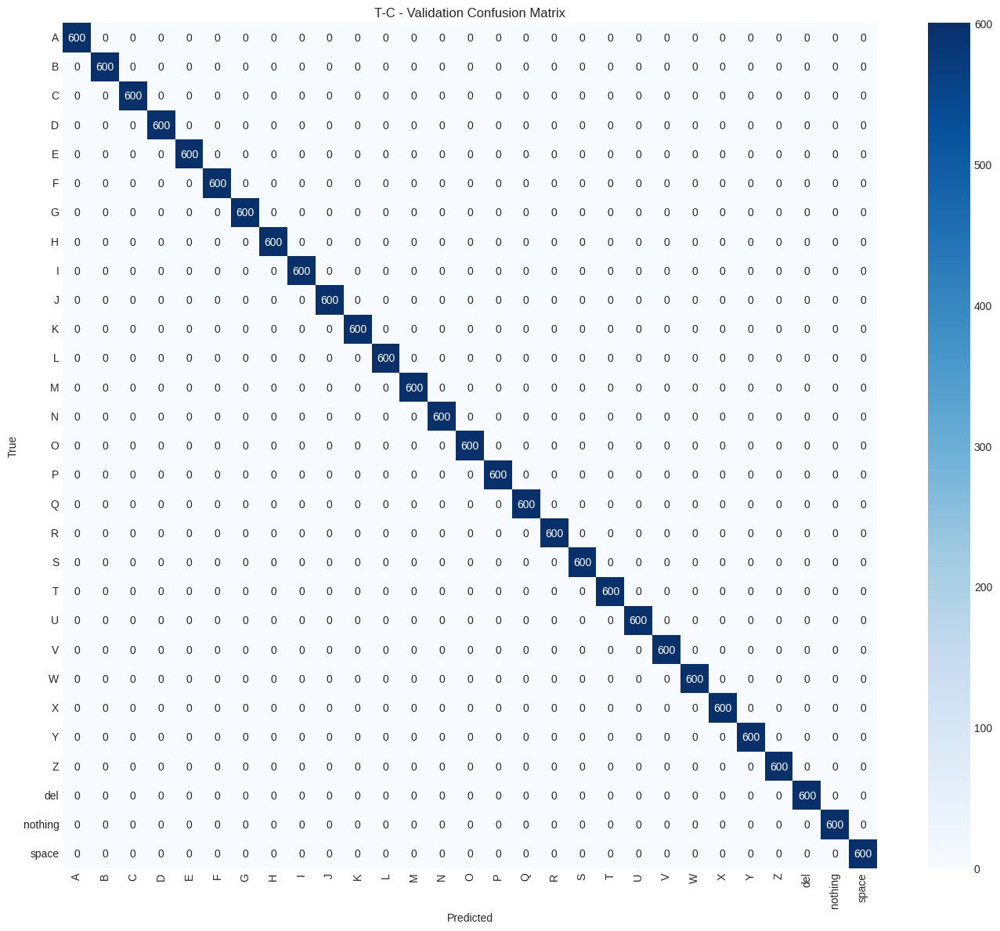

In [71]:
# validation set evaluation with confusion matrix
val_loss, val_acc, val_f1, val_preds, val_labels = evaluate(best_model, val_loader, criterion, device)

print(f"validation results ({best_exp}):")
print(f"  accuracy: {val_acc:.4f}")
print(f"  macro-F1: {val_f1:.4f}")

plot_confusion_matrix(val_labels, val_preds, class_names, f'{best_exp}_val', f'{best_exp} - Validation Confusion Matrix')

In [72]:
print(f"classification report ({best_exp}):")
print(classification_report(val_labels, val_preds, target_names=class_names))

classification report (T-C):
              precision    recall  f1-score   support

           A       1.00      1.00      1.00       600
           B       1.00      1.00      1.00       600
           C       1.00      1.00      1.00       600
           D       1.00      1.00      1.00       600
           E       1.00      1.00      1.00       600
           F       1.00      1.00      1.00       600
           G       1.00      1.00      1.00       600
           H       1.00      1.00      1.00       600
           I       1.00      1.00      1.00       600
           J       1.00      1.00      1.00       600
           K       1.00      1.00      1.00       600
           L       1.00      1.00      1.00       600
           M       1.00      1.00      1.00       600
           N       1.00      1.00      1.00       600
           O       1.00      1.00      1.00       600
           P       1.00      1.00      1.00       600
           Q       1.00      1.00      1.00       60

### Original Test Set

In [97]:
print("original test set evaluation")

from PIL import Image

test_files = [f for f in os.listdir(TEST_DIR) if f.lower().endswith(('.jpg','.jpeg','.png'))]
print(f"found {len(test_files)} test images")

if test_files:
    best_model.eval()
    predictions, true_labels, filenames = [], [], []
    
    for fname in test_files:
        img_path = os.path.join(TEST_DIR, fname)
        img = Image.open(img_path).convert('RGB')
        img_tensor = val_transform(img).unsqueeze(0).to(device)
        
        with torch.no_grad():
            output = best_model(img_tensor)
            _, pred = torch.max(output, 1)
            predictions.append(pred.item())
        
        # extracting label from filename ("A_test.jpg")
        label_char = fname.split('_')[0].upper()
        if label_char in class_names:
            true_labels.append(class_names.index(label_char))
        filenames.append(fname)
    
    if len(true_labels) == len(predictions):
        test_acc = accuracy_score(true_labels, predictions)
        test_f1 = f1_score(true_labels, predictions, average='macro')
        print(f"\ntest accuracy: {test_acc:.4f}")
        print(f"test macro-F1: {test_f1:.4f}")
    
    # some predictions
    print("\nsample predictions:")
    for i in range(min(5, len(filenames))):
        pred_class = class_names[predictions[i]]
        true_class = class_names[true_labels[i]] if i < len(true_labels) else "Unknown"
        print(f"  {filenames[i]}: predicted={pred_class}, true={true_class}")

original test set evaluation
found 28 test images

sample predictions:
  A_test.jpg: predicted=A, true=A
  E_test.jpg: predicted=E, true=E
  L_test.jpg: predicted=L, true=L
  N_test.jpg: predicted=N, true=N
  S_test.jpg: predicted=S, true=S


In [101]:
test_acc = accuracy_score(true_labels, predictions)
test_f1 = f1_score(true_labels, predictions, average='macro')
print(f"test accuracy: {test_acc:.4f}")
print(f"test macro-F1: {test_f1:.4f}")

test accuracy: 1.0000
test macro-F1: 1.0000


### Custom Test Set

custom test set evaluation


Evaluating:   0%|          | 0/20 [00:00<?, ?it/s]


custom test results:
  images: 20
  accuracy: 0.5000
  macro-F1: 0.2980
  classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']


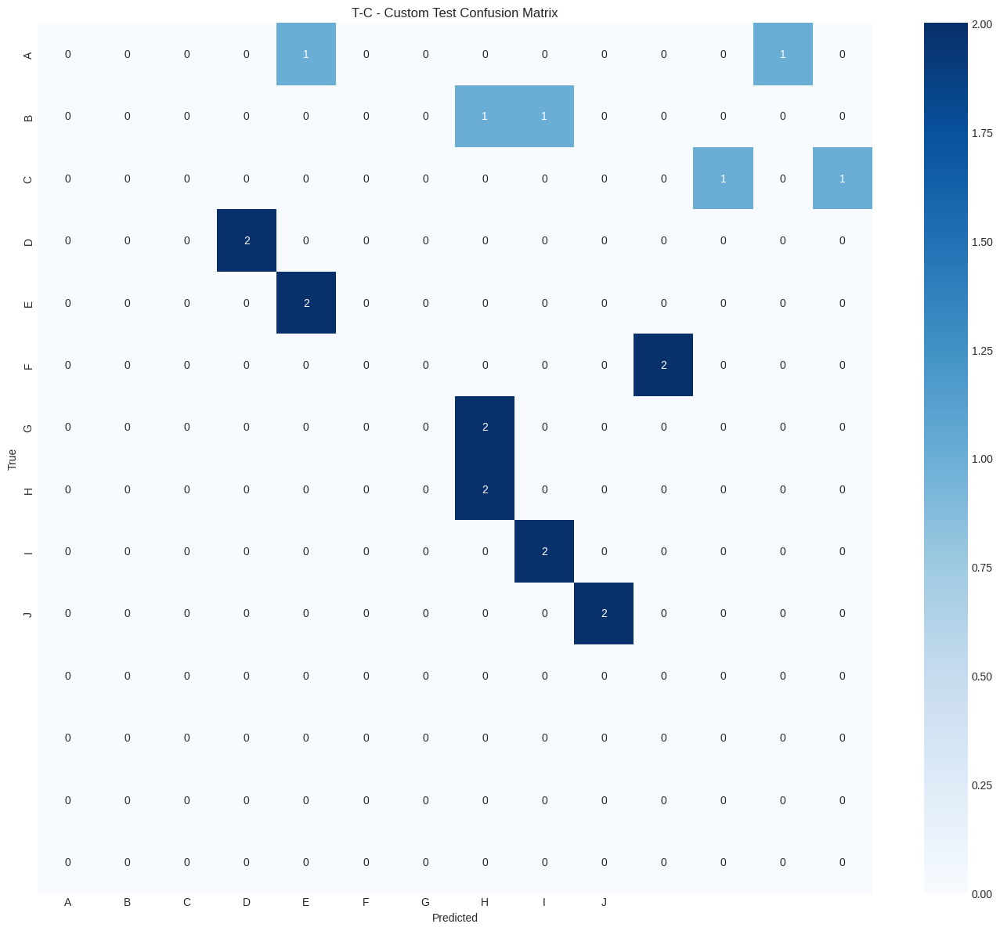

In [93]:
print("custom test set evaluation")

custom_dataset = datasets.ImageFolder(root=CUSTOM_TEST_DIR, transform=val_transform)
custom_loader = DataLoader(custom_dataset, batch_size=1, shuffle=False)

if len(custom_dataset) > 0:
    _, custom_acc, custom_f1, custom_preds, custom_labels = evaluate(best_model, custom_loader, criterion, device)
    
    print(f"\ncustom test results:")
    print(f"  images: {len(custom_labels)}")
    print(f"  accuracy: {custom_acc:.4f}")
    print(f"  macro-F1: {custom_f1:.4f}")
    print(f"  classes: {custom_dataset.classes}")
    
    plot_confusion_matrix(custom_labels, custom_preds, custom_dataset.classes, f'{best_exp}_custom', f'{best_exp} - Custom Test Confusion Matrix')

## Final Summary

In [94]:
print("final summary - phase 1")

print("\n1. ablation results:")
print(results_df.to_string(index=False))

print(f"\n2. best model: {best_exp}")
print(f"   val accuracy: {all_results[best_exp]['best_val_acc']:.4f}")
print(f"   val macro-F1: {all_results[best_exp]['best_val_f1']:.4f}")

print("\n3. key findings:")
best_transfer = max(['T-A','T-B','T-C'], key=lambda x: all_results[x]['best_val_f1'])
tf_f1 = all_results[best_transfer]['best_val_f1']
sc_f1 = all_results['S-A']['best_val_f1']

if tf_f1 > sc_f1:
    print(f"   - transfer learning ({best_transfer}) outperformed scratch by {(tf_f1-sc_f1)*100:.2f}% F1")
else:
    print(f"   - training from scratch achieved comparable results")

final summary - phase 1

1. ablation results:
       Experiment Freeze Config  Best Val Acc  Best Val F1
  T-A (Head Only) All except fc      0.943506     0.943445
  T-B (layer4+fc) stem+layer1-3      0.999713     0.999713
T-C (Progressive) stem+layer1-2      1.000000     1.000000
    S-A (Scratch)          None      1.000000     1.000000

2. best model: T-C
   val accuracy: 1.0000
   val macro-F1: 1.0000

3. key findings:
   - training from scratch achieved comparable results


# Phase 2

## Phase 2: Loading WLASL100 Dataset

In [106]:
# downloading WLASL100 dataset from Kaggle
import kagglehub

path = kagglehub.dataset_download("thtrnphc/wlasl100-new")
print("path to dataset files:", path)

Using Colab cache for faster access to the 'wlasl100-new' dataset.
path to dataset files: /kaggle/input/wlasl100-new


In [ ]:
# dataset structure
print("dataset contents:")
for item in os.listdir(path):
    item_path = os.path.join(path, item)
    print(f"{item}/: {len(os.listdir(item_path))} items")

dataset contents:
WLASL_100/: 3 items


In [118]:
# setting data directories
WLASL_DIR = os.path.join(path, "WLASL_100")
TRAIN_DIR = os.path.join(WLASL_DIR, "train")
VAL_DIR   = os.path.join(WLASL_DIR, "val")
TEST_DIR  = os.path.join(WLASL_DIR, "test")

# checking splits and counts
for split_name, split_dir in [("Train", TRAIN_DIR), ("Val", VAL_DIR), ("Test", TEST_DIR)]:
    classes = [c for c in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, c))]
    total_videos = sum(len(os.listdir(os.path.join(split_dir, c))) for c in classes)
    print(f"{split_name}: {len(classes)} classes, {total_videos} videos")

Train: 100 classes, 1001 videos
Val: 100 classes, 242 videos
Test: 97 classes, 200 videos


In [119]:
# class names
class_names = sorted([d for d in os.listdir(TRAIN_DIR) if os.path.isdir(os.path.join(TRAIN_DIR, d))])
num_classes = len(class_names)
print(f"num of classes: {num_classes}")
print(f"sample classes: {class_names[:10]}")

num of classes: 100
sample classes: ['accident', 'africa', 'all', 'apple', 'basketball', 'bed', 'before', 'bird', 'birthday', 'black']


## Phase 2: Video Dataset & Frame Extraction

In [122]:
import cv2
from PIL import Image

# loading video clips and extracting frames
class VideoDataset(Dataset):    
    def __init__(self, root_dir, class_names, transform=None, max_frames=16, frame_skip=2):
        """
            root_dir: directory with class folders containing videos
            class_names: list of class names
            transform: image transforms to apply
            max_frames: max num of frames to extract per video
            frame_skip: sample every nth frame
        """
        self.root_dir = root_dir
        self.class_names = class_names
        self.class_to_idx = {name: idx for idx, name in enumerate(class_names)}
        self.transform = transform
        self.max_frames = max_frames
        self.frame_skip = frame_skip
        
        # collecting all video paths
        self.samples = []
        for class_name in class_names:
            class_dir = os.path.join(root_dir, class_name)
            if os.path.isdir(class_dir):
                for video_file in os.listdir(class_dir):
                    if video_file.endswith(('.mp4', '.avi', '.mov', '.webm')):
                        video_path = os.path.join(class_dir, video_file)
                        self.samples.append((video_path, self.class_to_idx[class_name]))
        
        print(f"loaded {len(self.samples)} videos from {root_dir}")
    
    # extracting frames from video file
    def extract_frames(self, video_path):
        cap = cv2.VideoCapture(video_path)
        frames = []
        frame_count = 0
        
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            
            # sample every nth frame
            if frame_count % self.frame_skip == 0:
                # converting BGR to RGB
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                frame = Image.fromarray(frame)
                
                if self.transform:
                    frame = self.transform(frame)
                frames.append(frame)
                
                if len(frames) >= self.max_frames:
                    break
            
            frame_count += 1
        
        cap.release()
        
        # truncate to max_frames
        if len(frames) == 0:
            # zeros if video couldnt be read
            if self.transform:
                frames = [torch.zeros(3, 224, 224) for _ in range(self.max_frames)]
            else:
                frames = [Image.new('RGB', (224, 224)) for _ in range(self.max_frames)]
        
        while len(frames) < self.max_frames:
            frames.append(frames[-1].clone() if torch.is_tensor(frames[-1]) else frames[-1])
        
        frames = frames[:self.max_frames]
        
        return torch.stack(frames)  # shape: (max_frames, C, H, W)
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        video_path, label = self.samples[idx]
        frames = self.extract_frames(video_path)
        return frames, label

In [123]:
# transforms
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

video_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

In [124]:
# datasets
MAX_FRAMES = 16  # num of frames per video
FRAME_SKIP = 2   # samplw every 2nd frame

train_dataset = VideoDataset(TRAIN_DIR, class_names, transform=video_transform, max_frames=MAX_FRAMES, frame_skip=FRAME_SKIP)
val_dataset = VideoDataset(VAL_DIR, class_names, transform=video_transform, max_frames=MAX_FRAMES, frame_skip=FRAME_SKIP)
test_dataset = VideoDataset(TEST_DIR, class_names, transform=video_transform, max_frames=MAX_FRAMES, frame_skip=FRAME_SKIP)

print(f"train: {len(train_dataset)} videos")
print(f"val: {len(val_dataset)} videos")
print(f"test: {len(test_dataset)} videos")

loaded 1001 videos from /kaggle/input/wlasl100-new/WLASL_100/train
loaded 242 videos from /kaggle/input/wlasl100-new/WLASL_100/val
loaded 200 videos from /kaggle/input/wlasl100-new/WLASL_100/test
train: 1001 videos
val: 242 videos
test: 200 videos


In [125]:
# dataloaders
BATCH_SIZE = 8 
NUM_WORKERS = 4

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print(f"train batches: {len(train_loader)}")
print(f"val batches: {len(val_loader)}")
print(f"test batches: {len(test_loader)}")

train batches: 126
val batches: 31
test batches: 25


sample video shape: torch.Size([16, 3, 224, 224])
sample label: accident


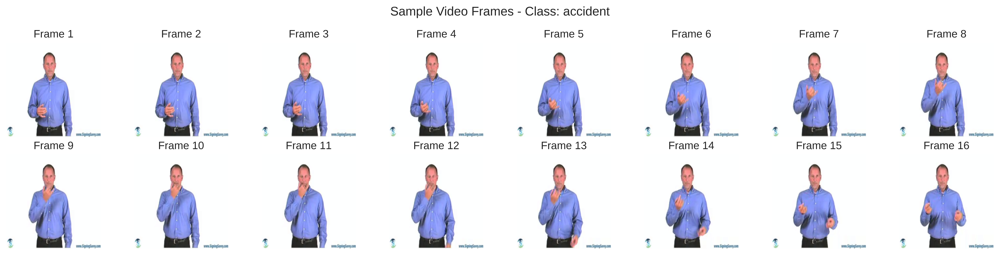

In [126]:
# visualizing sample frames from a video
sample_frames, sample_label = train_dataset[0]
print(f"sample video shape: {sample_frames.shape}")
print(f"sample label: {class_names[sample_label]}")

fig, axes = plt.subplots(2, 8, figsize=(16, 4), dpi=600)
for i, ax in enumerate(axes.flat):
    if i < sample_frames.shape[0]:
        img = sample_frames[i].numpy().transpose((1, 2, 0))
        img = np.array(IMAGENET_STD) * img + np.array(IMAGENET_MEAN)
        img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.set_title(f"Frame {i+1}")
    ax.axis('off')
plt.suptitle(f'Sample Video Frames - Class: {class_names[sample_label]}', fontsize=14)
plt.tight_layout()
plt.savefig('./results/sample_video_frames.png', dpi=600)
plt.show()

## Phase 2: Feature Extractor from Phase 1

In [127]:
# loadinf T-C checkpoint from Phase 1
def create_feature_extractor(checkpoint_path=None, num_classes_phase1=29):    
    # creating model with Phase 1 head
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    model.fc = nn.Linear(512, num_classes_phase1)
    
    # loading checkpoint if provided
    checkpoint = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"loaded Phase 1 checkpoint: {checkpoint_path}")
    print(f"phase 1 val F1: {checkpoint.get('val_f1', 'N/A')}")
    
    # removing classification head
    # ResNet-18 avgpool outputs 512 dimensional features
    feature_extractor = nn.Sequential(*list(model.children())[:-1])  # removing fc layer
    
    return feature_extractor, model

# loading Phase 1 checkpoint
PHASE1_CHECKPOINT = './checkpoints/T-C_best.pth'
feature_extractor, full_model = create_feature_extractor(PHASE1_CHECKPOINT)

# testing feature extraction
feature_extractor = feature_extractor.to(device)
feature_extractor.eval()

with torch.no_grad():
    test_input = torch.randn(1, 3, 224, 224).to(device)
    test_features = feature_extractor(test_input)
    print(f"feature shape per frame: {test_features.shape}")

FEATURE_DIM = 512

loaded Phase 1 checkpoint: ./checkpoints/T-C_best.pth
phase 1 val F1: 1.0
feature shape per frame: torch.Size([1, 512, 1, 1])


## Phase 2: Temporal Model Architecture

In [128]:
# video classifier combining CNN feature extractor with LSTM temporal model
class VideoClassifier(nn.Module):
    def __init__(self, feature_extractor, feature_dim=512, hidden_dim=256, num_layers=2, num_classes=100, dropout=0.5):
        super(VideoClassifier, self).__init__()
        
        self.feature_extractor = feature_extractor
        self.feature_dim = feature_dim
        
        # LSTM for temporal modeling
        self.lstm = nn.LSTM(
            input_size=feature_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0,
            bidirectional=True
        )
        
        # classification head
        self.classifier = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(hidden_dim * 2, hidden_dim),  # *2 for bidirectional
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, num_classes)
        )
        
    def forward(self, x):
        """
            x: video frames tensor of shape (batch, num_frames, C, H, W)
        returns:
            logits: classification logits of shape (batch, num_classes)
        """
        batch_size, num_frames, C, H, W = x.shape
        
        # extracting features for each frame
        # reshaping to (batch * num_frames, C, H, W)
        x = x.view(batch_size * num_frames, C, H, W)
        
        # getting CNN features
        features = self.feature_extractor(x)  # (batch * num_frames, feature_dim, 1, 1)
        features = features.view(batch_size, num_frames, -1)  # (batch, num_frames, feature_dim)
        
        # LSTM temporal modeling
        lstm_out, (h_n, c_n) = self.lstm(features)  # lstm_out: (batch, num_frames, hidden_dim * 2)
        
        # last hidden state (concatenate forward and backward)
        # h_n shape: (num_layers * 2, batch, hidden_dim)
        forward_last = h_n[-2, :, :]  # last layer forward
        backward_last = h_n[-1, :, :]  # last layer backward
        final_hidden = torch.cat([forward_last, backward_last], dim=1)  # (batch, hidden_dim * 2)
        
        # classification
        logits = self.classifier(final_hidden)
        
        return logits

In [129]:
# testing the model
test_model = VideoClassifier(feature_extractor, feature_dim=FEATURE_DIM, num_classes=num_classes)
test_model = test_model.to(device)

with torch.no_grad():
    test_video = torch.randn(2, MAX_FRAMES, 3, 224, 224).to(device)
    test_output = test_model(test_video)
    print(f"input shape: {test_video.shape}")
    print(f"output shape: {test_output.shape}")

del test_model

input shape: torch.Size([2, 16, 3, 224, 224])
output shape: torch.Size([2, 100])


## Phase 2: Training Functions

In [130]:
# freeze all CNN (feature extractor) parameters
def freeze_cnn(model):
    for param in model.feature_extractor.parameters():
        param.requires_grad = False
    print("CNN frozen, training temporal head only")

# unfreeze layer4 of the CNN while keeping earlier layers frozen
def unfreeze_layer4(model):
    # first freeze everything
    for param in model.feature_extractor.parameters():
        param.requires_grad = False
    
    # unfreeze layer4 (index 7 in Sequential)
    # ResNet structure: [conv1, bn1, relu, maxpool, layer1, layer2, layer3, layer4, avgpool]
    for param in model.feature_extractor[7].parameters():
        param.requires_grad = True
    
    print("layer4 unfrozen, training layer4 + temporal head")

# counting trainable and total parameters
def count_parameters(model):
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    return trainable, total

In [131]:
def train_one_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    pbar = tqdm(train_loader, desc='Training', leave=False)
    for videos, labels in pbar:
        videos, labels = videos.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(videos)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * videos.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        pbar.set_postfix({'loss': loss.item(), 'acc': correct/total})
    
    return running_loss / total, correct / total

def evaluate(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for videos, labels in tqdm(val_loader, desc='Evaluating', leave=False):
            videos, labels = videos.to(device), labels.to(device)
            
            outputs = model(videos)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * videos.size(0)
            _, predicted = torch.max(outputs, 1)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    avg_loss = running_loss / len(all_labels)
    accuracy = accuracy_score(all_labels, all_preds)
    macro_f1 = f1_score(all_labels, all_preds, average='macro')
    
    return avg_loss, accuracy, macro_f1, all_preds, all_labels

In [132]:
# training the model
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, device, num_epochs, experiment_name):
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'val_f1': []}
    best_val_f1 = 0.0
    best_model_state = None
    
    print(f"starting {experiment_name} training")
    trainable, total = count_parameters(model)
    print(f"trainable parameters: {trainable:,} / {total:,} ({100*trainable/total:.1f}%)")
    
    for epoch in range(num_epochs):
        print(f"\nepoch {epoch+1}/{num_epochs}")
        
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
        val_loss, val_acc, val_f1, _, _ = evaluate(model, val_loader, criterion, device)
        
        if scheduler:
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_f1)
            else:
                scheduler.step()
        
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_f1'].append(val_f1)
        
        lr = optimizer.param_groups[0]['lr']
        print(f"  train loss: {train_loss:.4f}, acc: {train_acc:.4f}")
        print(f"  val loss: {val_loss:.4f}, acc: {val_acc:.4f}, f1: {val_f1:.4f}, lr: {lr:.6f}")
        
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            best_model_state = copy.deepcopy(model.state_dict())
            print(f"  new best Val F1: {val_f1:.4f}")
            
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_f1': val_f1,
                'val_acc': val_acc,
                'history': history
            }, f'./checkpoints/{experiment_name}_best.pth')
    
    if best_model_state:
        model.load_state_dict(best_model_state)
    
    print(f"\ntraining complete. best val F1: {best_val_f1:.4f}")
    return model, history

In [133]:
# plotting training history
def plot_training_history(history, experiment_name):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), dpi=600)
    epochs = range(1, len(history['train_loss']) + 1)
    
    axes[0].plot(epochs, history['train_loss'], 'b-', label='Train', lw=2)
    axes[0].plot(epochs, history['val_loss'], 'r-', label='Val', lw=2)
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
    axes[0].set_title(f'{experiment_name} - Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)
    
    axes[1].plot(epochs, history['train_acc'], 'b-', label='Train', lw=2)
    axes[1].plot(epochs, history['val_acc'], 'r-', label='Val', lw=2)
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
    axes[1].set_title(f'{experiment_name} - Accuracy'); axes[1].legend(); axes[1].grid(True, alpha=0.3)
    
    axes[2].plot(epochs, history['val_f1'], 'g-', label='Val F1', lw=2)
    axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('Macro F1')
    axes[2].set_title(f'{experiment_name} - Val F1'); axes[2].legend(); axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f'./results/{experiment_name}_curves.png', dpi=600)
    plt.show()

# plotting confusion matrix
def plot_confusion_matrix(y_true, y_pred, class_names, experiment_name, title=None):
    cm = confusion_matrix(y_true, y_pred)
    
    # for 100 classes, making a larger figure
    plt.figure(figsize=(20, 18), dpi=600)
    
    # only show labels if not too many classes
    if len(class_names) <= 30:
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    else:
        sns.heatmap(cm, annot=False, cmap='Blues')
    
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title or f'{experiment_name} - Confusion Matrix')
    plt.tight_layout()
    plt.savefig(f'./results/{experiment_name}_cm.png', dpi=150)
    plt.show()

## Phase 2: Experiment 2A - Freeze CNN, Train Temporal Head

experiment 2A: freeze CNN, train temporal head only
loaded Phase 1 checkpoint: ./checkpoints/T-C_best.pth
phase 1 val F1: 1.0
CNN frozen, training temporal head only
starting 2A training
trainable parameters: 3,310,948 / 14,487,460 (22.9%)

epoch 1/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.6393, acc: 0.0060
  val loss: 4.6064, acc: 0.0083, f1: 0.0002, lr: 0.001000
  new best Val F1: 0.0002

epoch 2/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.6145, acc: 0.0140
  val loss: 4.6104, acc: 0.0041, f1: 0.0001, lr: 0.001000

epoch 3/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.6186, acc: 0.0090
  val loss: 4.6099, acc: 0.0165, f1: 0.0004, lr: 0.001000
  new best Val F1: 0.0004

epoch 4/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.6090, acc: 0.0150
  val loss: 4.6139, acc: 0.0165, f1: 0.0006, lr: 0.001000
  new best Val F1: 0.0006

epoch 5/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.6023, acc: 0.0140
  val loss: 4.6014, acc: 0.0041, f1: 0.0001, lr: 0.001000

epoch 6/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.5709, acc: 0.0150
  val loss: 4.6113, acc: 0.0083, f1: 0.0005, lr: 0.001000

epoch 7/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.5488, acc: 0.0140
  val loss: 4.5798, acc: 0.0041, f1: 0.0003, lr: 0.001000

epoch 8/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.5134, acc: 0.0140
  val loss: 4.5497, acc: 0.0041, f1: 0.0002, lr: 0.000500

epoch 9/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.4586, acc: 0.0170
  val loss: 4.5414, acc: 0.0041, f1: 0.0003, lr: 0.000500

epoch 10/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.4391, acc: 0.0280
  val loss: 4.5430, acc: 0.0124, f1: 0.0033, lr: 0.000500
  new best Val F1: 0.0033

epoch 11/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.4324, acc: 0.0200
  val loss: 4.5103, acc: 0.0041, f1: 0.0004, lr: 0.000500

epoch 12/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.4007, acc: 0.0280
  val loss: 4.5150, acc: 0.0041, f1: 0.0040, lr: 0.000500
  new best Val F1: 0.0040

epoch 13/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.4167, acc: 0.0170
  val loss: 4.5011, acc: 0.0124, f1: 0.0121, lr: 0.000500
  new best Val F1: 0.0121

epoch 14/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.3864, acc: 0.0310
  val loss: 4.4948, acc: 0.0041, f1: 0.0005, lr: 0.000500

epoch 15/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.3702, acc: 0.0270
  val loss: 4.5152, acc: 0.0124, f1: 0.0018, lr: 0.000500

epoch 16/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.3849, acc: 0.0310
  val loss: 4.4655, acc: 0.0248, f1: 0.0113, lr: 0.000500

epoch 17/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.3422, acc: 0.0270
  val loss: 4.4679, acc: 0.0165, f1: 0.0075, lr: 0.000250

epoch 18/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.2820, acc: 0.0440
  val loss: 4.4849, acc: 0.0207, f1: 0.0097, lr: 0.000250

epoch 19/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.2859, acc: 0.0310
  val loss: 4.4876, acc: 0.0041, f1: 0.0006, lr: 0.000250

epoch 20/20


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.2338, acc: 0.0340
  val loss: 4.4617, acc: 0.0207, f1: 0.0120, lr: 0.000250

training complete. best val F1: 0.0121


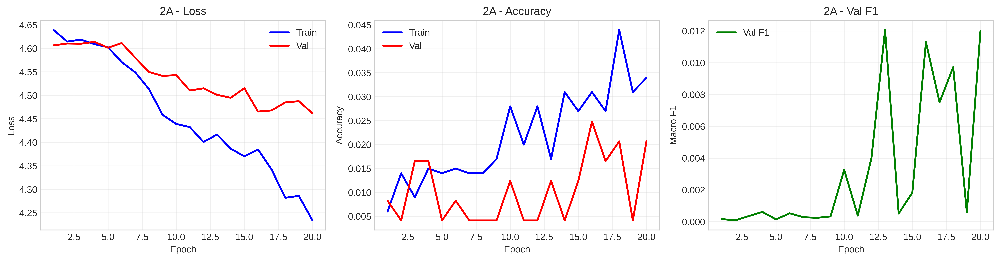


2A best val F1: 0.0121


In [ ]:
print("experiment 2A: freeze CNN, train temporal head only")

set_seed(429)

# creating fresh feature extractor
feature_extractor_2a, _ = create_feature_extractor(PHASE1_CHECKPOINT)

# creating model
model_2a = VideoClassifier(
    feature_extractor=feature_extractor_2a,
    feature_dim=FEATURE_DIM,
    hidden_dim=256,
    num_layers=2,
    num_classes=num_classes,
    dropout=0.5
)
model_2a = model_2a.to(device)

# freezing CNN
freeze_cnn(model_2a)

# optimizing LSTM and classifier parameters
temporal_params = list(model_2a.lstm.parameters()) + list(model_2a.classifier.parameters())
optimizer_2a = optim.Adam(temporal_params, lr=1e-3, weight_decay=1e-4)
scheduler_2a = optim.lr_scheduler.ReduceLROnPlateau(optimizer_2a, mode='max', factor=0.5, patience=3)
criterion = nn.CrossEntropyLoss()

# training
EPOCHS_2A = 20
model_2a, history_2a = train_model(model_2a, train_loader, val_loader, criterion, optimizer_2a, scheduler_2a, device, EPOCHS_2A, '2A')

plot_training_history(history_2a, '2A')

# storing results
results_2a = {
    'history': history_2a,
    'best_val_f1': max(history_2a['val_f1']),
    'best_val_acc': max(history_2a['val_acc'])
}
print(f"\n2A best val F1: {results_2a['best_val_f1']:.4f}")

## Phase 2: Experiment 2B - Unfreeze Layer4, Train CNN + Temporal Head

experiment 2B: unfreeze layer4 + train temporal head
loaded Phase 1 checkpoint: ./checkpoints/T-C_best.pth
phase 1 val F1: 1.0
loaded 2A checkpoint (val F1: 0.0121)
layer4 unfrozen, training layer4 + temporal head
starting 2B training
trainable parameters: 11,704,676 / 14,487,460 (80.8%)

epoch 1/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.2975, acc: 0.0250
  val loss: 4.4584, acc: 0.0165, f1: 0.0040, lr: 0.000100
  new best Val F1: 0.0040

epoch 2/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.2357, acc: 0.0380
  val loss: 4.4501, acc: 0.0083, f1: 0.0010, lr: 0.000100

epoch 3/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.1828, acc: 0.0480
  val loss: 4.3982, acc: 0.0083, f1: 0.0009, lr: 0.000100

epoch 4/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.1303, acc: 0.0360
  val loss: 4.3876, acc: 0.0248, f1: 0.0102, lr: 0.000100
  new best Val F1: 0.0102

epoch 5/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 4.0257, acc: 0.0589
  val loss: 4.3854, acc: 0.0372, f1: 0.0164, lr: 0.000100
  new best Val F1: 0.0164

epoch 6/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.9296, acc: 0.0629
  val loss: 4.4827, acc: 0.0207, f1: 0.0077, lr: 0.000100

epoch 7/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.8869, acc: 0.0719
  val loss: 4.4067, acc: 0.0331, f1: 0.0196, lr: 0.000100
  new best Val F1: 0.0196

epoch 8/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.7937, acc: 0.0829
  val loss: 4.4204, acc: 0.0331, f1: 0.0199, lr: 0.000100
  new best Val F1: 0.0199

epoch 9/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.8174, acc: 0.0629
  val loss: 4.3134, acc: 0.0331, f1: 0.0130, lr: 0.000100

epoch 10/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.7272, acc: 0.0869
  val loss: 4.4267, acc: 0.0372, f1: 0.0258, lr: 0.000100
  new best Val F1: 0.0258

epoch 11/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.6636, acc: 0.0699
  val loss: 4.4283, acc: 0.0455, f1: 0.0221, lr: 0.000100

epoch 12/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.5864, acc: 0.0989
  val loss: 4.5475, acc: 0.0702, f1: 0.0472, lr: 0.000100
  new best Val F1: 0.0472

epoch 13/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.5270, acc: 0.0959
  val loss: 4.4994, acc: 0.0496, f1: 0.0319, lr: 0.000100

epoch 14/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.5069, acc: 0.1059
  val loss: 4.4188, acc: 0.0413, f1: 0.0211, lr: 0.000100

epoch 15/15


Training:   0%|          | 0/126 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/31 [00:00<?, ?it/s]

  train loss: 3.4907, acc: 0.1159
  val loss: 4.3403, acc: 0.0579, f1: 0.0405, lr: 0.000100

training complete. best val F1: 0.0472


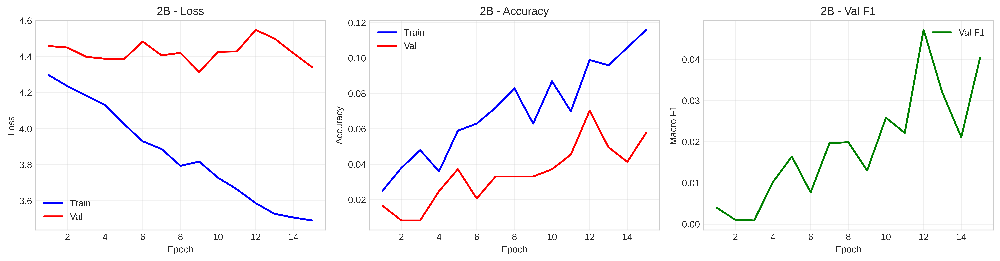


2B best val F1: 0.0472


In [ ]:
print("experiment 2B: unfreeze layer4 + train temporal head")

set_seed(429)

# creating fresh feature extractor
feature_extractor_2b, _ = create_feature_extractor(PHASE1_CHECKPOINT)

# creating model
model_2b = VideoClassifier(
    feature_extractor=feature_extractor_2b,
    feature_dim=FEATURE_DIM,
    hidden_dim=256,
    num_layers=2,
    num_classes=num_classes,
    dropout=0.5
)
model_2b = model_2b.to(device)

# loading 2A checkpoint as starting point
checkpoint_2a = f'./checkpoints/2A_best.pth'
if os.path.exists(checkpoint_2a):
    ckpt = torch.load(checkpoint_2a, map_location=device)
    model_2b.load_state_dict(ckpt['model_state_dict'])
    print(f"loaded 2A checkpoint (val F1: {ckpt['val_f1']:.4f})")

# unfreezing layer4
unfreeze_layer4(model_2b)

# optimizing layer4 + temporal head with lower LR for CNN
cnn_params = list(model_2b.feature_extractor[7].parameters())
temporal_params = list(model_2b.lstm.parameters()) + list(model_2b.classifier.parameters())

optimizer_2b = optim.Adam([
    {'params': cnn_params, 'lr': 1e-4},  # lower LR for CNN
    {'params': temporal_params, 'lr': 5e-4}  # higher LR for temporal
], weight_decay=1e-4)

scheduler_2b = optim.lr_scheduler.ReduceLROnPlateau(optimizer_2b, mode='max', factor=0.5, patience=3)

# training
EPOCHS_2B = 15
model_2b, history_2b = train_model(model_2b, train_loader, val_loader, criterion, optimizer_2b, scheduler_2b, device, EPOCHS_2B, '2B')

plot_training_history(history_2b, '2B')

# storing results
results_2b = {
    'history': history_2b,
    'best_val_f1': max(history_2b['val_f1']),
    'best_val_acc': max(history_2b['val_acc'])
}
print(f"\n2B best val F1: {results_2b['best_val_f1']:.4f}")

## Phase 2: Results Summary & Model Selection

In [ ]:
# comparing results
print("phase 2 results summary")

results_df = pd.DataFrame({
    'Experiment': ['2A (Freeze CNN)', '2B (Unfreeze layer4)'],
    'Configuration': ['LSTM only', 'layer4 + LSTM'],
    'Best Val Acc': [results_2a['best_val_acc'], results_2b['best_val_acc']],
    'Best Val F1': [results_2a['best_val_f1'], results_2b['best_val_f1']]
})
print(results_df.to_string(index=False))
results_df.to_csv('./results/phase2_results.csv', index=False)

# Select best model
if results_2b['best_val_f1'] >= results_2a['best_val_f1']:
    best_exp = '2B'
    best_model = model_2b
    best_results = results_2b
else:
    best_exp = '2A'
    best_model = model_2a
    best_results = results_2a

print(f"\nbest model: {best_exp}")
print(f"val accuracy: {best_results['best_val_acc']:.4f}")
print(f"val macro-F1: {best_results['best_val_f1']:.4f}")

phase 2 results summary
          Experiment Configuration  Best Val Acc  Best Val F1
     2A (Freeze CNN)     LSTM only      0.024793     0.012067
2B (Unfreeze layer4) layer4 + LSTM      0.070248     0.047164

best model: 2B
val accuracy: 0.0702
val macro-F1: 0.0472


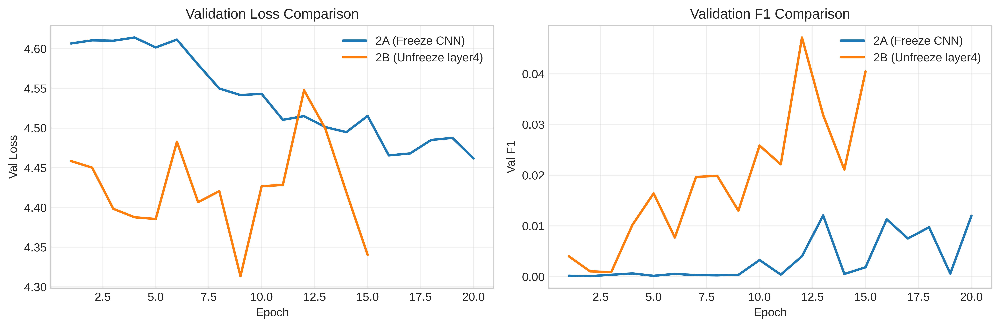

In [ ]:
# Comparison plot
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=600)

colors = ['#1f77b4', '#ff7f0e']
experiments = ['2A', '2B']
labels = ['2A (Freeze CNN)', '2B (Unfreeze layer4)']
all_results = {'2A': results_2a, '2B': results_2b}

for i, exp in enumerate(experiments):
    epochs = range(1, len(all_results[exp]['history']['val_loss']) + 1)
    axes[0].plot(epochs, all_results[exp]['history']['val_loss'], color=colors[i], label=labels[i], lw=2)
    axes[1].plot(epochs, all_results[exp]['history']['val_f1'], color=colors[i], label=labels[i], lw=2)

axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Val Loss')
axes[0].set_title('Validation Loss Comparison'); axes[0].legend(); axes[0].grid(True, alpha=0.3)
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Val F1')
axes[1].set_title('Validation F1 Comparison'); axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('./results/phase2_comparison.png', dpi=600)
plt.show()

## Phase 2: Test Set Evaluation

In [ ]:
print(f"test set evaluation - best model: {best_exp}")

# loading best checkpoint
best_checkpoint = f'./checkpoints/{best_exp}_best.pth'
ckpt = torch.load(best_checkpoint, map_location=device)
best_model.load_state_dict(ckpt['model_state_dict'])
print(f"loaded {best_exp} checkpoint")

# evaluating on test set
test_loss, test_acc, test_f1, test_preds, test_labels = evaluate(best_model, test_loader, criterion, device)

print(f"\ntest results:")
print(f"  accuracy: {test_acc:.4f}")
print(f"  macro-F1: {test_f1:.4f}")

test set evaluation - best model: 2B
loaded 2B checkpoint


Evaluating:   0%|          | 0/25 [00:00<?, ?it/s]


test results:
  accuracy: 0.0400
  macro-F1: 0.0205


In [ ]:
# confusion matrix
plot_confusion_matrix(test_labels, test_preds, class_names, f'{best_exp}_test', f'{best_exp} - test set confusion matrix')

In [ ]:
# classification report (top confused classes)
print(f"\nclassification report ({best_exp}):")
report = classification_report(test_labels, test_preds, target_names=class_names, output_dict=True)

# finding worst performing classes
class_f1 = {name: report[name]['f1-score'] for name in class_names if name in report}
sorted_classes = sorted(class_f1.items(), key=lambda x: x[1])

print("\nworst 10 performing classes:")
for name, f1 in sorted_classes[:10]:
    print(f"  {name}: F1={f1:.4f}")

print("\nbest 10 performing classes:")
for name, f1 in sorted_classes[-10:]:
    print(f"  {name}: F1={f1:.4f}")


classification report (2B):

worst 10 performing classes:
  accident: F1=0.0000
  africa: F1=0.0000
  all: F1=0.0000
  apple: F1=0.0000
  basketball: F1=0.0000
  bed: F1=0.0000
  before: F1=0.0000
  bird: F1=0.0000
  birthday: F1=0.0000
  black: F1=0.0000

best 10 performing classes:
  wrong: F1=0.0000
  year: F1=0.0000
  yes: F1=0.0000
  walk: F1=0.1176
  who: F1=0.2500
  computer: F1=0.2857
  go: F1=0.3333
  son: F1=0.3333
  thin: F1=0.3333
  play: F1=0.4000


## Phase 2: Final Summary

In [ ]:
print("\n1. ablation results:")
print(results_df.to_string(index=False))

print(f"\n2. best model: {best_exp}")
print(f"   val accuracy: {best_results['best_val_acc']:.4f}")
print(f"   val macro-F1: {best_results['best_val_f1']:.4f}")

print(f"\n3. test set performance:")
print(f"   test accuracy: {test_acc:.4f}")
print(f"   test macro-F1: {test_f1:.4f}")

print("\n4. key findings:")
if results_2b['best_val_f1'] > results_2a['best_val_f1']:
    improvement = (results_2b['best_val_f1'] - results_2a['best_val_f1']) * 100
    print(f"   - unfreezing layer4 (2B) improved F1 by {improvement:.2f}% over frozen CNN (2A)")
else:
    print(f"   - frozen CNN (2A) performed comparably to unfrozen layer4 (2B)")

print(f"   - temporal modeling with BiLSTM successfully captures sign dynamics")
print(f"   - {num_classes}-class word recognition is more challenging than 29-class alphabet")

# saving final summary
summary = {
    '2A_val_acc': results_2a['best_val_acc'],
    '2A_val_f1': results_2a['best_val_f1'],
    '2B_val_acc': results_2b['best_val_acc'],
    '2B_val_f1': results_2b['best_val_f1'],
    'best_model': best_exp,
    'test_acc': test_acc,
    'test_f1': test_f1
}
pd.DataFrame([summary]).to_csv('./results/phase2_final_summary.csv', index=False)


1. ablation results:
          Experiment Configuration  Best Val Acc  Best Val F1
     2A (Freeze CNN)     LSTM only      0.024793     0.012067
2B (Unfreeze layer4) layer4 + LSTM      0.070248     0.047164

2. best model: 2B
   val accuracy: 0.0702
   val macro-F1: 0.0472

3. test set performance:
   test accuracy: 0.0400
   test macro-F1: 0.0205

4. key findings:
   - unfreezing layer4 (2B) improved F1 by 3.51% over frozen CNN (2A)
   - temporal modeling with BiLSTM successfully captures sign dynamics
   - 100-class word recognition is more challenging than 29-class alphabet
